In [3]:
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
from collections import defaultdict

import os
import pandas_profiling

import scipy.stats as ss
from collections import Counter
import math

In [4]:
# Loading the full CSV data file 
bank_data = pd.read_csv('../data/raw/bank-additional/bank-additional-full.csv', sep=";")# Loading the full CSV data file 


In [4]:
bank_data.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [5]:
bank_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  object 
 2   marital         41188 non-null  object 
 3   education       41188 non-null  object 
 4   default         41188 non-null  object 
 5   housing         41188 non-null  object 
 6   loan            41188 non-null  object 
 7   contact         41188 non-null  object 
 8   month           41188 non-null  object 
 9   day_of_week     41188 non-null  object 
 10  duration        41188 non-null  int64  
 11  campaign        41188 non-null  int64  
 12  pdays           41188 non-null  int64  
 13  previous        41188 non-null  int64  
 14  poutcome        41188 non-null  object 
 15  emp.var.rate    41188 non-null  float64
 16  cons.price.idx  41188 non-null  float64
 17  cons.conf.idx   41188 non-null 

In [9]:
# Rename the target variable y to be response
bank_data = bank_data.rename({'y': 'response'}, axis=1)

### Drop duplicates

In [5]:
bank_data.drop_duplicates(inplace=True)

## Exploring the Categorical Features

This part provides an analysis of the categorical features, it explores these features distribution along with its relation with the response variable (aka **correlation analysis**). The aim is to find the candidate feature that might be better predictors to who is going to subscribe to the **term deposit** service represented in the response variable. Such insights are valuable for modeling and making informed business decisions.

#### 1. We use visualization to inspect the relationship between these categorical variables and the response variable

#### 2. Cramér's V statistic is used as a measure of association between two categorical variables.
 Cramer’s V (aka $\Phi$) is a normalized version of chi-square test statistic, that determines the effect size. Its values are between [0 and 1]
[Interpreting Cramer’s V](https://www.datascienceblog.net/post/statistical_test/effect_size/), 
To interpret Cramer’s V, the following approach is often used:

-  V in [0.1, 0.3]: weak association 
- V in [0.4, 0.5]: medium association 
- V > 0.5$: strong association


In [10]:
# extracting the categorical features
cat_columns = bank_data.select_dtypes(include='object').columns

#### Viewing the unique categories in each variable

In [11]:
for feature in cat_columns:
    uniq = np.unique(bank_data[feature])
    print('{}: {} distinct values -  {}'.format(feature,len(uniq),uniq))

job: 12 distinct values -  ['admin.' 'blue-collar' 'entrepreneur' 'housemaid' 'management' 'retired'
 'self-employed' 'services' 'student' 'technician' 'unemployed' 'unknown']
marital: 4 distinct values -  ['divorced' 'married' 'single' 'unknown']
education: 8 distinct values -  ['basic.4y' 'basic.6y' 'basic.9y' 'high.school' 'illiterate'
 'professional.course' 'university.degree' 'unknown']
default: 3 distinct values -  ['no' 'unknown' 'yes']
housing: 3 distinct values -  ['no' 'unknown' 'yes']
loan: 3 distinct values -  ['no' 'unknown' 'yes']
contact: 2 distinct values -  ['cellular' 'telephone']
month: 10 distinct values -  ['apr' 'aug' 'dec' 'jul' 'jun' 'mar' 'may' 'nov' 'oct' 'sep']
day_of_week: 5 distinct values -  ['fri' 'mon' 'thu' 'tue' 'wed']
poutcome: 3 distinct values -  ['failure' 'nonexistent' 'success']
response: 2 distinct values -  ['no' 'yes']


In [12]:
# Show duplicate observations
bank_data.loc[bank_data.duplicated()]

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,response
1266,39,blue-collar,married,basic.6y,no,no,no,telephone,may,thu,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.855,5191.0,no
12261,36,retired,married,unknown,no,no,no,telephone,jul,thu,...,1,999,0,nonexistent,1.4,93.918,-42.7,4.966,5228.1,no
14234,27,technician,single,professional.course,no,no,no,cellular,jul,mon,...,2,999,0,nonexistent,1.4,93.918,-42.7,4.962,5228.1,no
16956,47,technician,divorced,high.school,no,yes,no,cellular,jul,thu,...,3,999,0,nonexistent,1.4,93.918,-42.7,4.962,5228.1,no
18465,32,technician,single,professional.course,no,yes,no,cellular,jul,thu,...,1,999,0,nonexistent,1.4,93.918,-42.7,4.968,5228.1,no
20216,55,services,married,high.school,unknown,no,no,cellular,aug,mon,...,1,999,0,nonexistent,1.4,93.444,-36.1,4.965,5228.1,no
20534,41,technician,married,professional.course,no,yes,no,cellular,aug,tue,...,1,999,0,nonexistent,1.4,93.444,-36.1,4.966,5228.1,no
25217,39,admin.,married,university.degree,no,no,no,cellular,nov,tue,...,2,999,0,nonexistent,-0.1,93.200,-42.0,4.153,5195.8,no
28477,24,services,single,high.school,no,yes,no,cellular,apr,tue,...,1,999,0,nonexistent,-1.8,93.075,-47.1,1.423,5099.1,no
32516,35,admin.,married,university.degree,no,yes,no,cellular,may,fri,...,4,999,0,nonexistent,-1.8,92.893,-46.2,1.313,5099.1,no


In [13]:
bank_data.shape[0]

41188

In [14]:
bank_data.drop_duplicates(inplace=True)

In [15]:
bank_data.shape[0]

41176

In [16]:
41188 - 41176

12

**The number of unique values for each categorical feature**

In [17]:
def categories_counts(feature, df=bank_data):
    ''' Calculates the count and percentage of each value of a categorical variable'''
    counts = pd.concat([df[feature].value_counts(), round(100 * df[feature].value_counts()/df.shape[0], 2)], axis=1)
    counts.columns=['count', '%']
    counts.reset_index(inplace =True)
    counts.rename(columns={'index': feature}, inplace=True)
    return counts

**It is imbalanced data set, the response shows only 11% of the customers subscribed**

In [18]:
categories_counts('response')

,response,count,%
0,no,36537,88.73
1,yes,4639,11.27


#### Cramér's V function 

In [178]:
# This code is taken from this source: (https://www.kaggle.com/phaethonprime/eda-and-logistic-regression)
def cramers_corrected_stat(confusion_matrix):
    """ calculate Cramers V statistic for categorical-categorical association.
        uses correction from Bergsma and Wicher, 
        Journal of the Korean Statistical Society 42 (2013): 323-328
    """
    chi2 = ss.chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    phi2 = chi2/n
    r,k = confusion_matrix.shape
    phi2corr = max(0, phi2 - ((k-1)*(r-1))/(n-1))    
    rcorr = r - ((r-1)**2)/(n-1)
    kcorr = k - ((k-1)**2)/(n-1)
    return np.sqrt(phi2corr / min( (kcorr-1), (rcorr-1)))

#### Function for visualizing the distribution of the Categorical features and printing Cramér's V value

In [177]:
# Bar plot for the distribution of the categorical fatures.
def distibution_bar_plot(feature, response= 'response'):
    # priniting the unique values for each feature
    print(f'\n--------   The distribution of {feature} -----------\n')
    uniq = np.unique(bank_data[feature])
    print('{}: {} distinct values -  {}\n'.format(feature,len(uniq),uniq))
    print('\t Note:The shown pecentatges % are based on the total of all custmers in the data subscribed and not subscribed.\n')
    sns.set(font_scale=1.1)

    # resizing the figure according to the number of categories for visualization coordination
    if len(uniq) > 7:
        fig, ax = plt.subplots(1, 2, figsize=(18, 8))
    elif len(uniq) <= 2 : 
        fig, ax = plt.subplots(1, 2, figsize=(18, 2))
            
    else:
         fig, ax = plt.subplots(1, 2, figsize=(18, 4))
        

    # Ploting just the distribution of each variable values in the first subplot
    sns.countplot(y=feature, data=bank_data, order = bank_data[feature].value_counts().index, ax=ax[0])
    ax[0].set_title(f'The Percentage Count of "{feature}" Categories', )
    ax[0].set_xlabel('Percentage Count')
    ax[0].set_ylabel(f'{feature}')
    #ax[0].axis("off")
    ax[0].set_ylabel(f'{feature}')
    total = len(bank_data[feature])
    for p in ax[0].patches:
            percentage = '{:.1f}%'.format(100 * p.get_width()/total)
            x = p.get_x() + p.get_width() + 0.02
            y = p.get_y() + p.get_height()/2
            ax[0].annotate(percentage, (x, y))
            
            
    # Ploting the distribution of each variable values along with the response varaible in the second subplot
    sns.countplot(y=feature, data=bank_data, hue='response', order = bank_data[feature].value_counts().index, ax=ax[1])
    total = len(bank_data[feature])
    for p in ax[1].patches:
            percentage = '{:.1f}%'.format(100 * p.get_width()/total)
            x = p.get_x() + p.get_width() + 0.02
            y = p.get_y() + p.get_height()/2
            ax[1].annotate(percentage, (x, y))
    ax[1].set_title(f'The Percentage Count of "{feature}" Categories with the Response Vriable')
    ax[1].set_xlabel('Percentage Count')
    #ax[1].axis("off")

    plt.subplots_adjust(wspace=0.2);
    plt.show()
    
    # prinitng the Cramér's V value by passing the confusion matrix between the feature and the response variable
    print("Cramér's V = " , cramers_corrected_stat(pd.crosstab(bank_data[feature], bank_data["response"])))

In [22]:
cat_columns_without_response = cat_columns.delete(-1)

#### List the features by the strength of association with the response variable 

In [23]:
# define a default dict.
phi = defaultdict(float)

# pupulate the dict with cramers V values 
for k in cat_columns_without_response:
    phi[k] = cramers_corrected_stat(pd.crosstab(bank_data[k], bank_data["response"]))
# Sort the dict descendin 
phi = {k: v for k, v in sorted(phi.items(), key=lambda item: item[1], reverse=True)}
# change the dict to pandas dataframe
phi = pd.DataFrame(list(phi.items()),columns = ['Feature','Cramers_V'])
phi

,Feature,Cramers_V
0,poutcome,0.320448
1,month,0.274123
2,job,0.151955
3,contact,0.144612
4,default,0.099123
5,education,0.067183
6,marital,0.053976
7,day_of_week,0.023143
8,housing,0.009533
9,loan,0.000000


### The **poutcome** Feature


--------   The distribution of poutcome -----------

poutcome: 3 distinct values -  ['failure' 'nonexistent' 'success']

	 Note:The shown pecentatges % are based on the total of all custmers in the data subscribed and not subscribed.



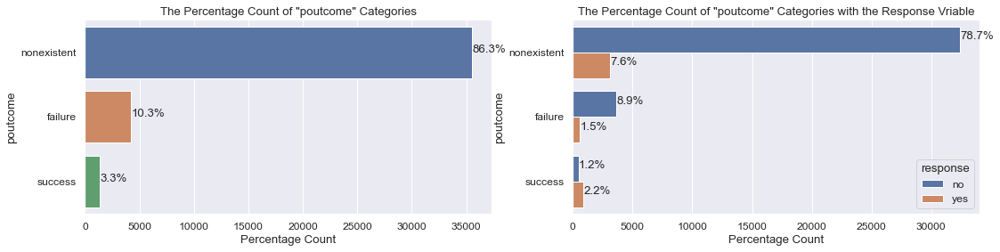

Cramér's V =  0.32044835703020846

The response variable distribution:
   response  count      %
0       no  36537  88.73
1      yes   4639  11.27


In [24]:
distibution_bar_plot('poutcome')
print("\nThe response variable distribution:\n", categories_counts('response'))

- #### Frequency Matrix

In [25]:
# Calculate the subscription frequency and subscription rate per category for each category in the feature  
def cross_tab(x, y='response'):
    '''this function Calculates the subscription frequency and subscription rate per category for each category in the feature ordred by,
    The "All" row and column from the calculated matrix is the sum of all columns and rows. 
    It possible to be not located at the very end because of sorting by subscription rate '''
    df= pd.crosstab(bank_data[x], bank_data[y], margins=True)
    df[f'within class subscription per {x} %'] = df.loc[:, 'yes'] / df.loc[:, 'All'] *100
    print('Notice: The "All" row and column from the calculated matrix is the sum of values in that row and column respectively.\nIt possible to be not located at the very end because of sorting by subscription rate.')
    return df.sort_values(f"within class subscription per {x} %", ascending=False)

In [26]:
cross_tab('poutcome')

Notice: The "All" row and column from the calculated matrix is the sum of values in that row and column respectively.
It possible to be not located at the very end because of sorting by subscription rate.


response,no,yes,All,within class subscription per poutcome %
poutcome,,,,
success,479,894,1373,65.112891
failure,3647,605,4252,14.228598
All,36537,4639,41176,11.266272
nonexistent,32411,3140,35551,8.832382


In [27]:
# we can use pandas crosstab to calclate the percentage for each cell row wise.
(pd.crosstab(bank_data.poutcome, bank_data.response, margins=True, normalize='index') * 100).rename(columns={'no': 'No: within class%', 'yes': 'Yes: within class%'})

response,No: within class%,Yes: within class%
poutcome,,
failure,85.771402,14.228598
nonexistent,91.167618,8.832382
success,34.887109,65.112891
All,88.733728,11.266272


Cramers V values are between [0 and 1] 0 indicates no association and the closer to 1 the stronger the association. None of the features has a strong association with phi greater than (0.5) from the table above. However, the poutcome feature has the highest value of ($\Phi = 0.32$).
* **Insights**

- The figure below shows that most of the subscribers were not previously contacted. The total of subscribers in this data set is 11.27%, 7.6% of the subscribers in this data set are new customers not previously contacted. Total subscribers are 4640, and 3141 of them are new customers. The percentages in the figure are based on the total number of customers (the data points) Approximately 68% of the subscribers are new customers. However, most of the contacted customers (86.3%) are new. As shown in the frequency table below, the subscription rate among the none previously contacted customers is the lowest with an 8.8% rate although they were the most contacted group.

- About 65% of the successfully subscribed customers through the previous campaign have subscribed as a result of this campaign. Previously subscribed customers showed more tendency to subscribe to other products.
- 14.2% of the 4252 customers who did not subscribe in the previous campaign have subscribed.

### The **month** Feature


--------   The distribution of month -----------

month: 10 distinct values -  ['apr' 'aug' 'dec' 'jul' 'jun' 'mar' 'may' 'nov' 'oct' 'sep']

	 Note:The shown pecentatges % are based on the total of all custmers in the data subscribed and not subscribed.



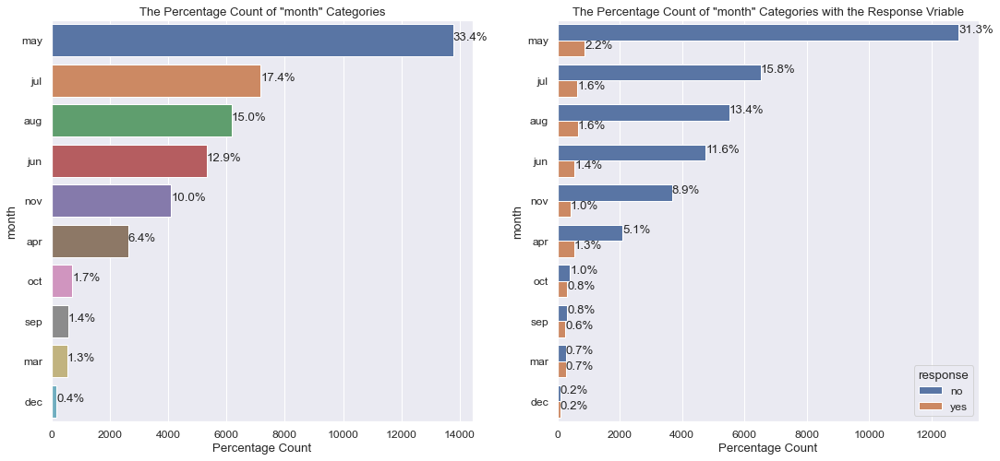

Cramér's V =  0.2741230962483959

The response variable distribution:
   response  count      %
0       no  36537  88.73
1      yes   4639  11.27


In [28]:
distibution_bar_plot('month')
print("\nThe response variable distribution:\n", categories_counts('response'))

In [29]:
cross_tab('month')

Notice: The "All" row and column from the calculated matrix is the sum of values in that row and column respectively.
It possible to be not located at the very end because of sorting by subscription rate.


response,no,yes,All,within class subscription per month %
month,,,,
mar,270,276,546,50.549451
dec,93,89,182,48.901099
sep,314,256,570,44.912281
oct,402,315,717,43.933054
apr,2092,539,2631,20.486507
All,36537,4639,41176,11.266272
aug,5521,655,6176,10.605570
jun,4759,559,5318,10.511470
nov,3684,416,4100,10.146341


* **Insights**
- The month feature has the second-highest cramers V, $\Phi = 0.27$; indicates the second strongest association with the response variable. However, the association is weak with $\Phi = 0.27$.
- May month has the highest subscription rate; 2.2% of the total data. However, May also has received the most campaign calls with 33.4%. Thus, looking at the subscription rate and ignoring the call rate can be miThe table below shows the subscription rate per month in descending order.
- Although Mars and December have the fewest campaign calls, their subscription rates are the highest among other months, 50.5% and 50% accordingly.

### The **job** Feature


--------   The distribution of job -----------

job: 12 distinct values -  ['admin.' 'blue-collar' 'entrepreneur' 'housemaid' 'management' 'retired'
 'self-employed' 'services' 'student' 'technician' 'unemployed' 'unknown']

	 Note:The shown pecentatges % are based on the total of all custmers in the data subscribed and not subscribed.



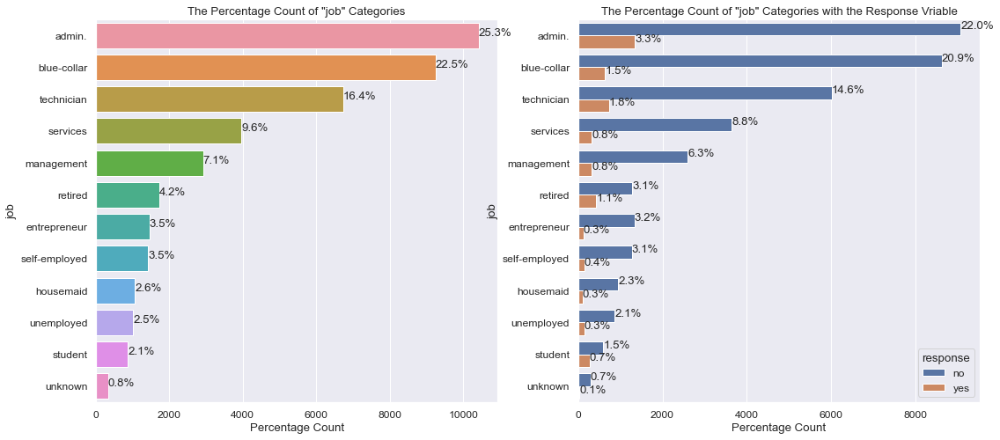

Cramér's V =  0.15195496226188143

The response variable distribution:
   response  count      %
0       no  36537  88.73
1      yes   4639  11.27


In [30]:
distibution_bar_plot('job')
print("\nThe response variable distribution:\n", categories_counts('response'))

In [31]:
cross_tab('job')

Notice: The "All" row and column from the calculated matrix is the sum of values in that row and column respectively.
It possible to be not located at the very end because of sorting by subscription rate.


response,no,yes,All,within class subscription per job %
job,,,,
student,600,275,875,31.428571
retired,1284,434,1718,25.261932
unemployed,870,144,1014,14.201183
admin.,9068,1351,10419,12.966695
All,36537,4639,41176,11.266272
management,2596,328,2924,11.217510
unknown,293,37,330,11.212121
technician,6009,730,6739,10.832468
self-employed,1272,149,1421,10.485574


* **Insights**
- The job feature has the third highest cramers V, $\Phi = 0.15$; indicates the third strongest association with the response variable. However, the association is also weak.
- The admin job has the highest subscription rate; 3.3% of the total customers. However, admins also have received the most campaign calls with 25.3%. The campaign probably focused on the admins because they are expected to have better income, leading to more chances of profitable subscription to a term deposit. However, out of 10419 admins contacted only 1351 have subscribed, about only 13% of the contacted admins were subscribed. Admins are ranked 4th among the within-class subscription rate as shown in the frequency table.
- Ironically, students are ranked first among the within-class subscription rate with 31.4%, followed by the retired with 25.3% although students are the least contacted class in this dataset.

### The **contact** Feature


--------   The distribution of contact -----------

contact: 2 distinct values -  ['cellular' 'telephone']

	 Note:The shown pecentatges % are based on the total of all custmers in the data subscribed and not subscribed.



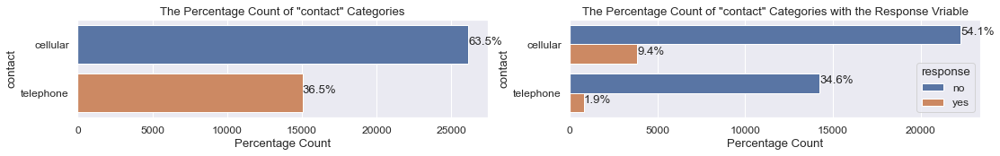

Cramér's V =  0.14461226452325537

The response variable distribution:
   response  count      %
0       no  36537  88.73
1      yes   4639  11.27 

Notice: The "All" row and column from the calculated matrix is the sum of values in that row and column respectively.
It possible to be not located at the very end because of sorting by subscription rate.


response,no,yes,All,within class subscription per contact %
contact,,,,
cellular,22283,3852,26135,14.738856
All,36537,4639,41176,11.266272
telephone,14254,787,15041,5.232365


In [32]:
distibution_bar_plot('contact')
print("\nThe response variable distribution:\n", categories_counts('response'),'\n')
cross_tab('contact')

* **Insights**
- The contact feature has the forth-highest cramers V, $\Phi = 0.14$. However, the association is also weak.
- The cellular has received the highest calls and also has the highest within class subscription rate with about 15% subscription of the called group of 26135 customers.

### The **default** Feature


--------   The distribution of default -----------

default: 3 distinct values -  ['no' 'unknown' 'yes']

	 Note:The shown pecentatges % are based on the total of all custmers in the data subscribed and not subscribed.



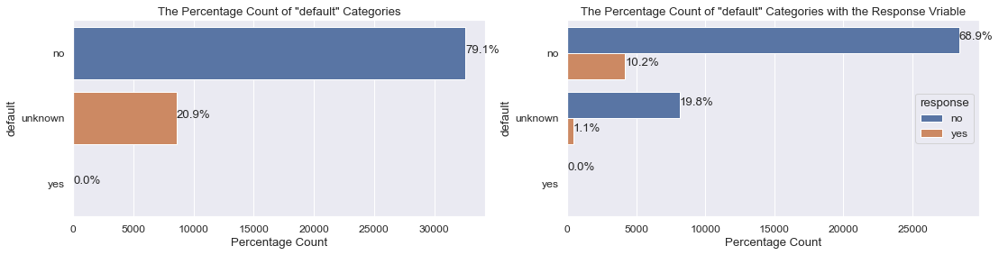

Cramér's V =  0.09912256778551454

The response variable distribution:
   response  count      %
0       no  36537  88.73
1      yes   4639  11.27 

Notice: The "All" row and column from the calculated matrix is the sum of values in that row and column respectively.
It possible to be not located at the very end because of sorting by subscription rate.


response,no,yes,All,within class subscription per default %
default,,,,
no,28381,4196,32577,12.880253
All,36537,4639,41176,11.266272
unknown,8153,443,8596,5.153560
yes,3,0,3,0.000000


In [34]:
distibution_bar_plot('default')
print("\nThe response variable distribution:\n", categories_counts('response'),'\n')
cross_tab('default')

* **Insights**
- The default feature has the fifth-highest Cramer’s V = 0.1; indicates a weak association with the response variable.
- The known non-defaulted customers tend to have more subscriptions with a 12.9% within-class subscription rate. However, about 20.9% of default statuses are unknown. The known 3 defaulted customers did not subscribe. The unknown default status has a 5.1% within-class subscription rate. Customers of this class can be defaulted or not.

### The **education** Feature


--------   The distribution of education -----------

education: 8 distinct values -  ['basic.4y' 'basic.6y' 'basic.9y' 'high.school' 'illiterate'
 'professional.course' 'university.degree' 'unknown']

	 Note:The shown pecentatges % are based on the total of all custmers in the data subscribed and not subscribed.



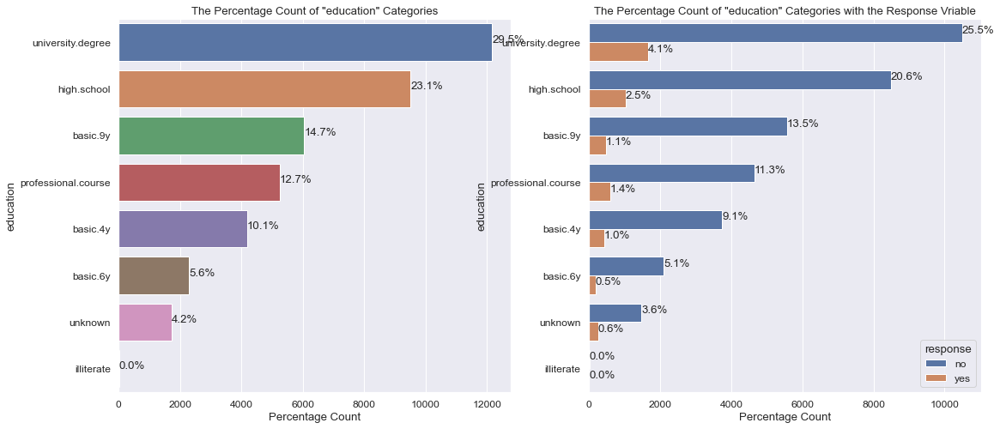

Cramér's V =  0.0671834857776241

The response variable distribution:
   response  count      %
0       no  36537  88.73
1      yes   4639  11.27 

Notice: The "All" row and column from the calculated matrix is the sum of values in that row and column respectively.
It possible to be not located at the very end because of sorting by subscription rate.


response,no,yes,All,within class subscription per education %
education,,,,
illiterate,14,4,18,22.222222
unknown,1479,251,1730,14.508671
university.degree,10495,1669,12164,13.720816
professional.course,4645,595,5240,11.354962
All,36537,4639,41176,11.266272
high.school,8481,1031,9512,10.838940
basic.4y,3748,428,4176,10.249042
basic.6y,2103,188,2291,8.206024
basic.9y,5572,473,6045,7.824648


In [35]:
distibution_bar_plot('education')
print("\nThe response variable distribution:\n", categories_counts('response'),'\n')
cross_tab('education')

* **Insights**
- The education feature has the sixth highest cramers V, $\Phi = 0.07$; which indicates weak association with the response variable.
- Customers who hold a university degree are the most contacted, they represent 29.5% of the customers in this data set. However, this class is ranked third in the within-class subscription rate with 13.7%.
- Surprisingly, the illiterate class has the highest within-class subscription rate with 22.2%. However, only 18 of this class were contacted and 4 of them subscribed. Other than this notice, it seems like higher education has more chances of subscription.

### The **marital** Feature


--------   The distribution of marital -----------

marital: 4 distinct values -  ['divorced' 'married' 'single' 'unknown']

	 Note:The shown pecentatges % are based on the total of all custmers in the data subscribed and not subscribed.



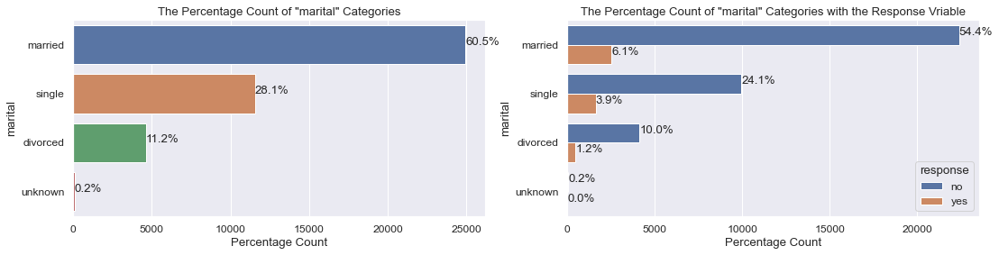

Cramér's V =  0.05397591965805853

The response variable distribution:
   response  count      %
0       no  36537  88.73
1      yes   4639  11.27 

Notice: The "All" row and column from the calculated matrix is the sum of values in that row and column respectively.
It possible to be not located at the very end because of sorting by subscription rate.


response,no,yes,All,within class subscription per marital %
marital,,,,
unknown,68,12,80,15.000000
single,9944,1620,11564,14.008993
All,36537,4639,41176,11.266272
divorced,4135,476,4611,10.323140
married,22390,2531,24921,10.156093


In [36]:
distibution_bar_plot('marital')
print("\nThe response variable distribution:\n", categories_counts('response'),'\n')
cross_tab('marital')

* **Insights**
- The marital feature has weak association with the response variable, cramers V, $\Phi = 0.05$.
- 60.5% of the called customers are married. However, the within-class subscription rate of married customers is the lowest with 10.6%. Single customers have a higher within-class subscription rate of 14%. 80 customers have unknown marital status.

### The **day_of_week** Feature


--------   The distribution of day_of_week -----------

day_of_week: 5 distinct values -  ['fri' 'mon' 'thu' 'tue' 'wed']

	 Note:The shown pecentatges % are based on the total of all custmers in the data subscribed and not subscribed.



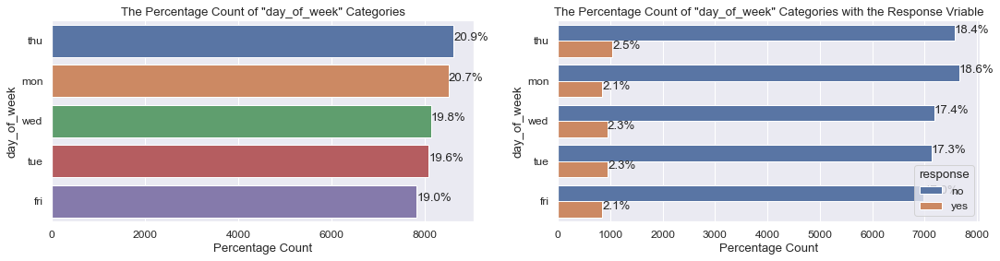

Cramér's V =  0.023143461958776656

The response variable distribution:
   response  count      %
0       no  36537  88.73
1      yes   4639  11.27 

Notice: The "All" row and column from the calculated matrix is the sum of values in that row and column respectively.
It possible to be not located at the very end because of sorting by subscription rate.


response,no,yes,All,within class subscription per day_of_week %
day_of_week,,,,
thu,7574,1044,8618,12.114180
tue,7133,953,8086,11.785803
wed,7185,949,8134,11.667076
All,36537,4639,41176,11.266272
fri,6980,846,7826,10.810120
mon,7665,847,8512,9.950658


In [37]:
distibution_bar_plot('day_of_week')
print("\nThe response variable distribution:\n", categories_counts('response'),'\n')
cross_tab('day_of_week')

* **Insights**
- The day_of_week feature has weak association with the response variable, cramers V, $\Phi = 0.02$.
- The within-class subscription rate of day_of_week is mostly the same for all days, Thursday is the highest with 12.1% and Monday is the lowest with 10%.

### The **housing** Feature


--------   The distribution of housing -----------

housing: 3 distinct values -  ['no' 'unknown' 'yes']

	 Note:The shown pecentatges % are based on the total of all custmers in the data subscribed and not subscribed.



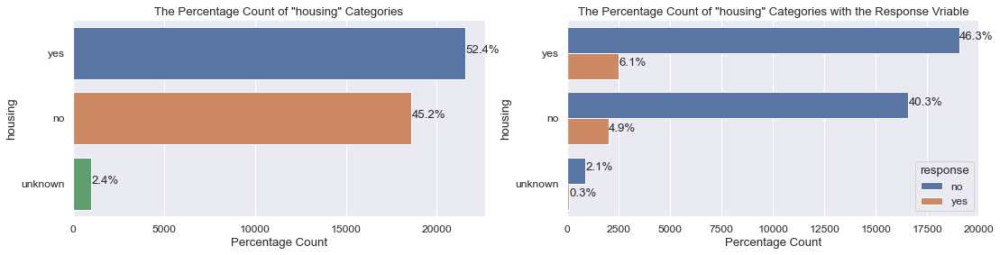

Cramér's V =  0.009533253430909073

The response variable distribution:
   response  count      %
0       no  36537  88.73
1      yes   4639  11.27 

Notice: The "All" row and column from the calculated matrix is the sum of values in that row and column respectively.
It possible to be not located at the very end because of sorting by subscription rate.


response,no,yes,All,within class subscription per housing %
housing,,,,
yes,19064,2507,21571,11.622085
All,36537,4639,41176,11.266272
no,16590,2025,18615,10.878324
unknown,883,107,990,10.808081


In [38]:
distibution_bar_plot('housing')
print("\nThe response variable distribution:\n", categories_counts('response'),'\n')
cross_tab('housing')

* **Insights**
- The housing feature has weak association with the response variable, cramers V, $\Phi = 0.0095$.
- The within class subscription rate of 990 is mostly the same for the known classes. There are 990 customers (2.4%) with unknown housing status. 

### The **loan** Feature


--------   The distribution of loan -----------

loan: 3 distinct values -  ['no' 'unknown' 'yes']

	 Note:The shown pecentatges % are based on the total of all custmers in the data subscribed and not subscribed.



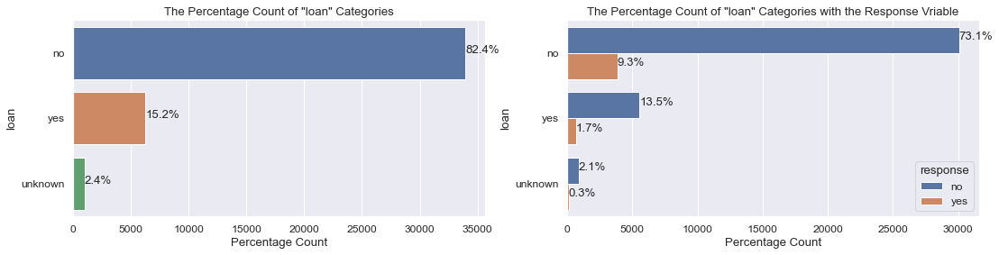

Cramér's V =  0.0

The response variable distribution:
   response  count      %
0       no  36537  88.73
1      yes   4639  11.27 

Notice: The "All" row and column from the calculated matrix is the sum of values in that row and column respectively.
It possible to be not located at the very end because of sorting by subscription rate.


response,no,yes,All,within class subscription per loan %
loan,,,,
no,30089,3849,33938,11.341269
All,36537,4639,41176,11.266272
yes,5565,683,6248,10.931498
unknown,883,107,990,10.808081


In [39]:
distibution_bar_plot('loan')
print("\nThe response variable distribution:\n", categories_counts('response'),'\n')
cross_tab('loan')

* **Insights**
- The loan feature has weak association with the response variable, cramers V, $\Phi = 0.0$.

## Explore the Correlation between all of the categorical variables 

In [40]:
# This code is used to populated a corelation matrix, of corrected cramers V stat, as a pandas dataframe
rows= []

for var1 in cat_columns:
  col = []
  for var2 in cat_columns :
    cramers = cramers_corrected_stat(pd.crosstab(bank_data[var1], bank_data[var2]))
    col.append(round(cramers,2)) # Keeping of the rounded value of the Cramer's V  
  rows.append(col)
  
cramers_results = np.array(rows)
df = pd.DataFrame(cramers_results, columns = cat_columns, index = cat_columns)



df

,job,marital,education,default,housing,loan,contact,month,day_of_week,poutcome,response
job,1.00,0.18,0.36,0.15,0.01,0.01,0.13,0.11,0.02,0.10,0.15
marital,0.18,1.00,0.12,0.10,0.01,0.00,0.07,0.05,0.01,0.04,0.05
education,0.36,0.12,1.00,0.17,0.01,0.00,0.12,0.09,0.02,0.04,0.07
default,0.15,0.10,0.17,1.00,0.01,0.00,0.14,0.11,0.01,0.08,0.10
housing,0.01,0.01,0.01,0.01,1.00,0.71,0.08,0.05,0.01,0.02,0.01
loan,0.01,0.00,0.00,0.00,0.71,1.00,0.02,0.02,0.01,0.00,0.00
contact,0.13,0.07,0.12,0.14,0.08,0.02,1.00,0.61,0.05,0.24,0.14
month,0.11,0.05,0.09,0.11,0.05,0.02,0.61,1.00,0.07,0.24,0.27
day_of_week,0.02,0.01,0.02,0.01,0.01,0.01,0.05,0.07,1.00,0.01,0.02
poutcome,0.10,0.04,0.04,0.08,0.02,0.00,0.24,0.24,0.01,1.00,0.32


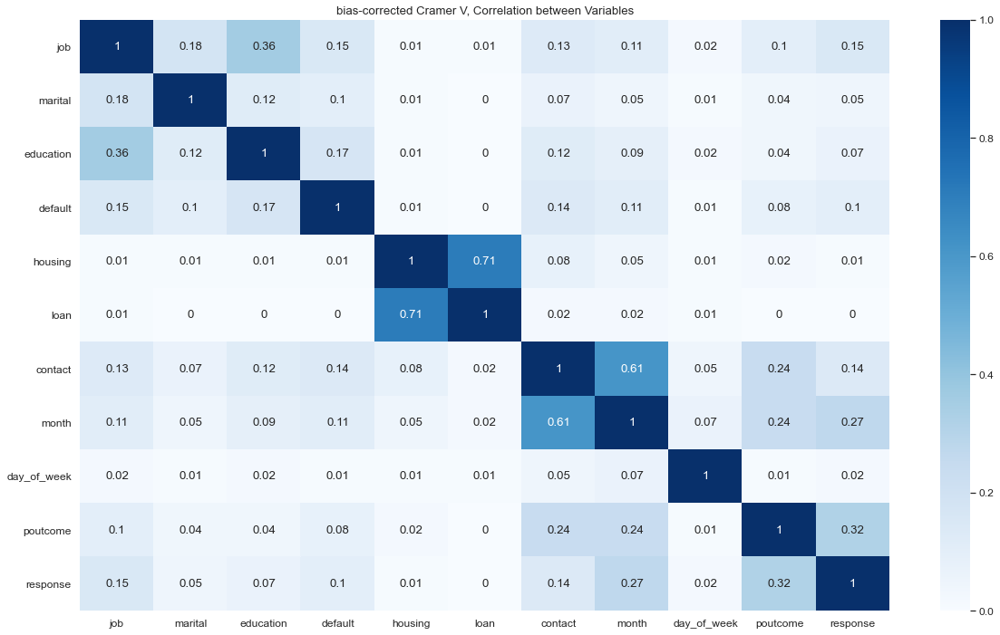

In [41]:
fig, ax = plt.subplots(figsize=(20, 12))
ax = sns.heatmap(df, annot=True, cmap="Blues", ax=ax); ax.set_title("bias-corrected Cramer V, Correlation between Variables");

* **Insights**
- From the heatmap above we can see a strong association between loan and house with , cramers V, $\Phi = 0.71$, and moderate association between education and job  $\Phi = 0.36$. Also, a strong association between month and contact with $\Phi = 0.61$


## Exploring the Numerical Features

In [42]:
num_cols = bank_data.select_dtypes(include='number').columns
print('Numerical columns are', num_cols)
bank_data[num_cols].describe()

Numerical columns are Index(['age', 'duration', 'campaign', 'pdays', 'previous', 'emp.var.rate',
       'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed'],
      dtype='object')


,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
count,41176.00000,41176.000000,41176.000000,41176.000000,41176.000000,41176.000000,41176.000000,41176.000000,41176.000000,41176.000000
mean,40.02380,258.315815,2.567879,962.464810,0.173013,0.081922,93.575720,-40.502863,3.621293,5167.034870
std,10.42068,259.305321,2.770318,186.937102,0.494964,1.570883,0.578839,4.627860,1.734437,72.251364
min,17.00000,0.000000,1.000000,0.000000,0.000000,-3.400000,92.201000,-50.800000,0.634000,4963.600000
25%,32.00000,102.000000,1.000000,999.000000,0.000000,-1.800000,93.075000,-42.700000,1.344000,5099.100000
50%,38.00000,180.000000,2.000000,999.000000,0.000000,1.100000,93.749000,-41.800000,4.857000,5191.000000
75%,47.00000,319.000000,3.000000,999.000000,0.000000,1.400000,93.994000,-36.400000,4.961000,5228.100000
max,98.00000,4918.000000,56.000000,999.000000,7.000000,1.400000,94.767000,-26.900000,5.045000,5228.100000


### The **age** Feature

In [75]:
def distribution_plot(var):
    sns.set_style("whitegrid")

    # Initialize the matplotlib figure
    fig, ax = plt.subplots(1, 2, figsize=(20.0, 10))
    fig.suptitle(var.capitalize() + ' Distribution', fontsize=15 )
    palette = sns.color_palette("Paired", 2)
    
    # Plot the distribution as a Histogram
    sns.histplot(data= bank_data, x = var, hue='response', bins=50, ax=ax[0], kde= True )

    #dist_plot = sns.displot(bank_data[var], bins=50, rug=True, ax=ax[0])
    dist_plot.set_xlabel(var,fontsize=15)
    mean = bank_data[var].mean(); median = bank_data[var].median() 

    ax[0].axvline(mean, color='r', linestyle='--', label='{:5.0f}'.format(mean))
    ax[0].axvline(median, color='g', linestyle='-')
    # Box plot 
    sns.boxplot(data = bank_data, x= var, y= bank_data['response'], ax=ax[1])
    ax[1].set_xlabel(var,fontsize=15)
    ax[1].set_ylabel("Response", fontsize=15)
    

    plt.tight_layout(h_pad=2)
    plt.show()
    # Print the second and third quartile

    classes_description = bank_data.groupby('response')[[var]].describe()
    print(f'The {var} description for for both respnse classes =\n {classes_description}')

    

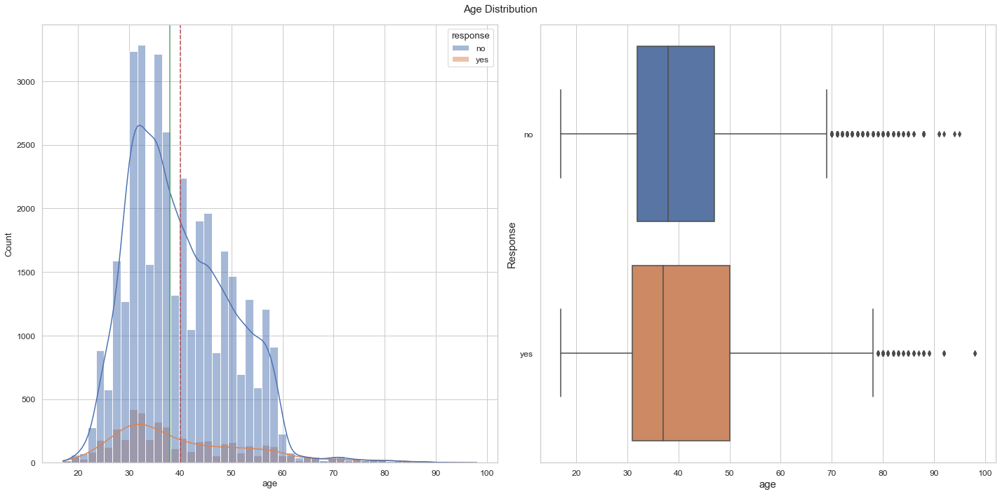

The age description for for both respnse classes =
               age                                                    
            count       mean        std   min   25%   50%   75%   max
response                                                             
no        36537.0  39.910994   9.897176  17.0  32.0  38.0  47.0  95.0
yes        4639.0  40.912266  13.838838  17.0  31.0  37.0  50.0  98.0


In [76]:
distribution_plot('age')

In [77]:
bank_data.groupby('response')[['age']].describe()

age                                                    
            count       mean        std   min   25%   50%   75%   max
response                                                             
no        36537.0  39.910994   9.897176  17.0  32.0  38.0  47.0  95.0
yes        4639.0  40.912266  13.838838  17.0  31.0  37.0  50.0  98.0

* **Insights**
- The age distribution for both classes of the target variable is mostly overlapping. The median age for subscribers is 37 and none subscribers are 38.
- The maximum age is 98 and the minimum is 17.
- The age feature seems not to be a good indicator of the target variable.
- Outliers appear in both classes.


### The **duration** Feature

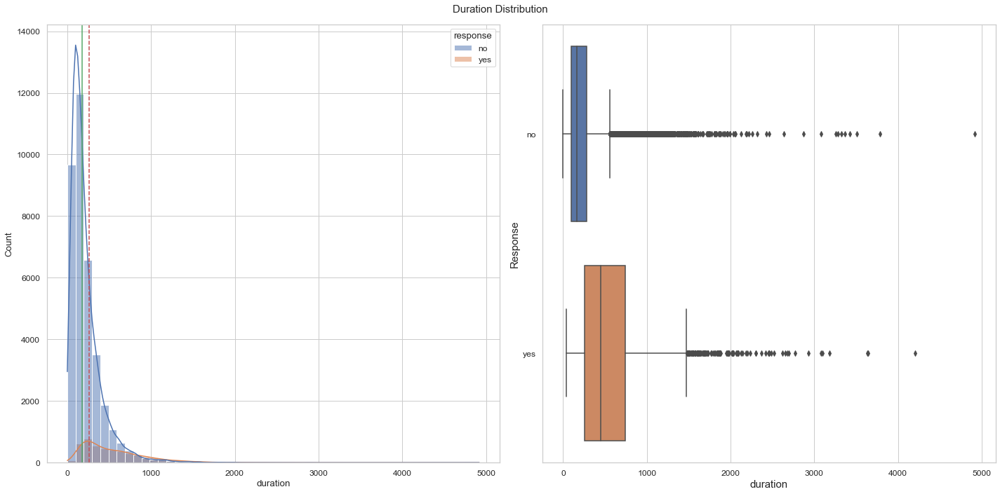

The duration description for for both respnse classes =
          duration                                                           
            count        mean         std   min    25%    50%    75%     max
response                                                                    
no        36537.0  220.868079  207.116178   0.0   95.0  164.0  279.0  4918.0
yes        4639.0  553.256090  401.190736  37.0  253.5  449.0  741.5  4199.0


In [78]:
distribution_plot('duration')

* **Insights**
- The box plot below shows that subscribed customers had a longer call duration. The duration seems to be correlated with the response variable.
- However, the call duration is known after the call and the outcome of the call is likely to be known. Thus, this feature is not available as a predictor for prediction before the call is made.


### The **campaign** Feature

 The campaign feature refers to the number of contacts performed during this campaign and for this client (numeric, includes last contact.

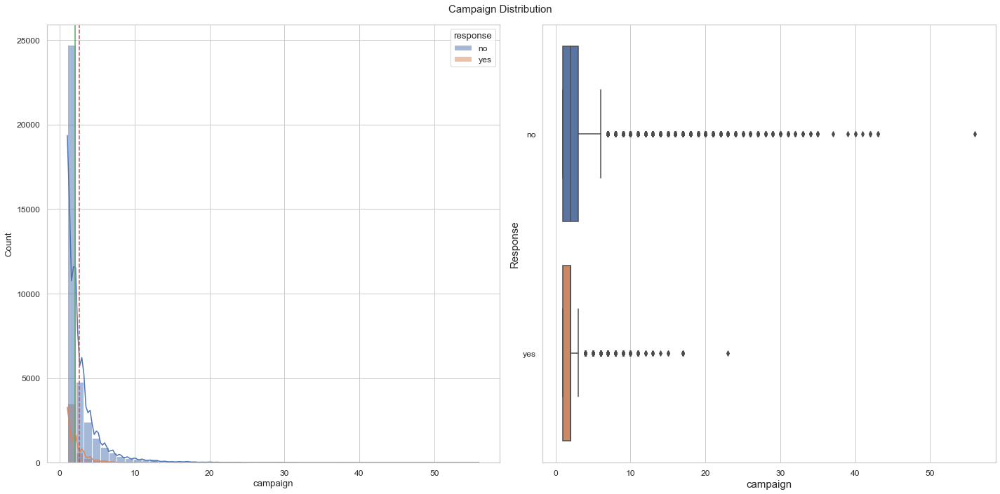

The campaign description for for both respnse classes =
          campaign                                              
            count      mean       std  min  25%  50%  75%   max
response                                                       
no        36537.0  2.633385  2.873768  1.0  1.0  2.0  3.0  56.0
yes        4639.0  2.051951  1.666353  1.0  1.0  2.0  2.0  23.0


In [79]:
distribution_plot('campaign')

In [84]:
bank_data.groupby('response')[['campaign']].median().rename(columns={'campaign': 'median for campaign'})

,median for campaign
response,
no,2
yes,2


In [85]:
bank_data.groupby('response')['campaign'].value_counts().unstack()

campaign,1,2,3,4,5,6,7,8,9,10,...,33,34,35,37,39,40,41,42,43,56
response,,,,,,,,,,,,,,,,,,,,,
no,15335.0,9357.0,4766.0,2401.0,1479.0,904.0,591.0,383.0,266.0,213.0,...,4.0,3.0,5.0,1.0,1.0,2.0,1.0,2.0,2.0,1.0
yes,2299.0,1211.0,574.0,249.0,120.0,75.0,38.0,17.0,17.0,12.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


* **Insights**
- More campaign calls for a particular customer did not lead to the service subscription. The plots show that most of the subscribed customers received one or two calls.
- Also, most of the none subscribed customers has received a fewer call.
- This feature does not seem a strong predictor.

### The **pdays** Feature

 The pdays feature refers to number of days that passed by after the client was last contacted from a previous campaign (numeric; 999 means client was not previously contacted.

In [89]:
# replace the value 999 by 0
bank_data['pdays'].replace(999, 0, inplace=True)

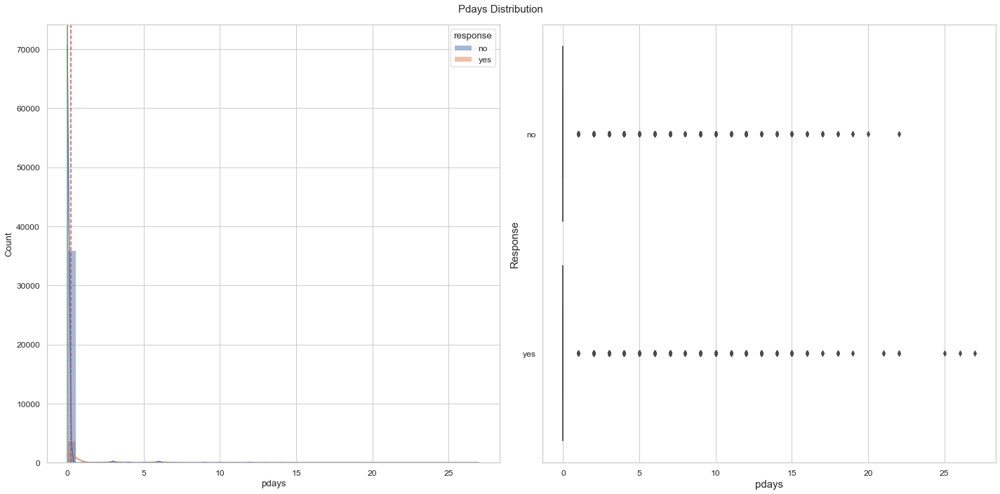

The pdays description for for both respnse classes =
             pdays                                              
            count      mean       std  min  25%  50%  75%   max
response                                                       
no        36537.0  0.092892  0.897084  0.0  0.0  0.0  0.0  22.0
yes        4639.0  1.232593  2.943628  0.0  0.0  0.0  0.0  27.0


In [90]:
distribution_plot('pdays')

In [96]:
bank_data.groupby('response')[['pdays']].median().rename(columns={'pdays': 'median for pdays'})

,median for pdays
response,
no,0
yes,0


In [92]:
bank_data.groupby('response')['pdays'].value_counts().unstack()

pdays,0,1,2,3,4,5,6,7,8,9,...,16,17,18,19,20,21,22,25,26,27
response,,,,,,,,,,,,,,,,,,,,,
no,35994.0,18.0,24.0,141.0,55.0,17.0,123.0,20.0,6.0,29.0,...,5.0,6.0,3.0,2.0,1.0,NaN,1.0,NaN,NaN,NaN
yes,3682.0,8.0,37.0,298.0,63.0,29.0,289.0,40.0,12.0,35.0,...,6.0,2.0,4.0,1.0,NaN,2.0,2.0,1.0,1.0,1.0


* **Insights**
- Most of the clients were not contacted before.
- the **pdays**This feature by itself can not be a predictor of the response variable.

### The **previous** Feature

 The previous feature refers to number of contacts performed before this campaign and for this client (numeric).

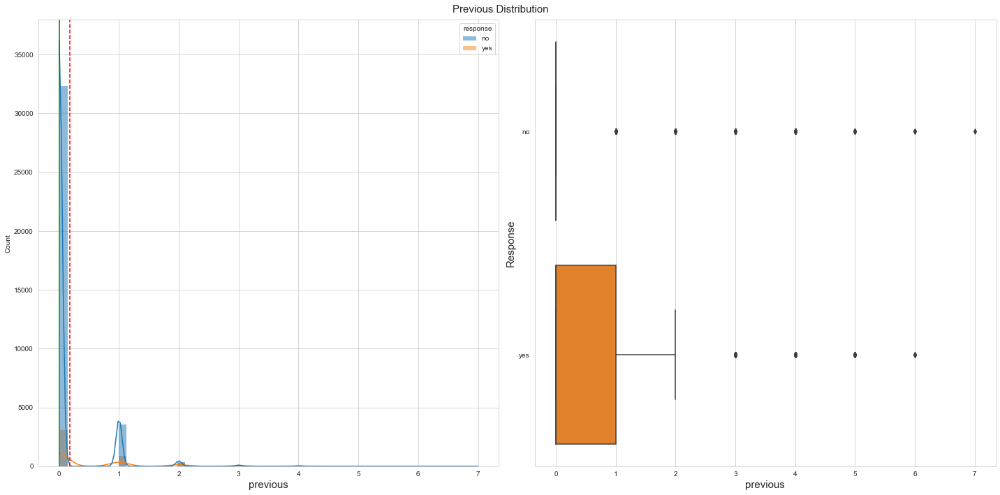

The previous description for for both respnse classes =
          previous                                             
            count      mean       std  min  25%  50%  75%  max
response                                                      
no        36537.0  0.132414  0.409254  0.0  0.0  0.0  0.0  7.0
yes        4639.0  0.492779  0.860406  0.0  0.0  0.0  1.0  6.0


In [400]:
distribution_plot('previous')

In [94]:
bank_data.groupby('response')[['previous']].median().rename(columns={'previous': 'median for previous'})

,median for previous
response,
no,0
yes,0


In [97]:
bank_data.groupby('response')['previous'].value_counts().unstack()

previous,0,1,2,3,4,5,6,7
response,,,,,,,,
no,32411.0,3594.0,404.0,88.0,32.0,5.0,2.0,1.0
yes,3140.0,967.0,350.0,128.0,38.0,13.0,3.0,NaN


* **Insights**
- Most of the clients were not contacted before. The highest number of contacts is 7. Only 13.7% of the clients were previously contacted. The highest number of contacts is 7 and it only happened one time. 
- As the table shows, increasing the number of contacts did not lead to more subscriptions.


### The **emp.var.rate** Feature

 The emp.var.rate feature refers to employment variation rate — quarterly indicator (numeric)

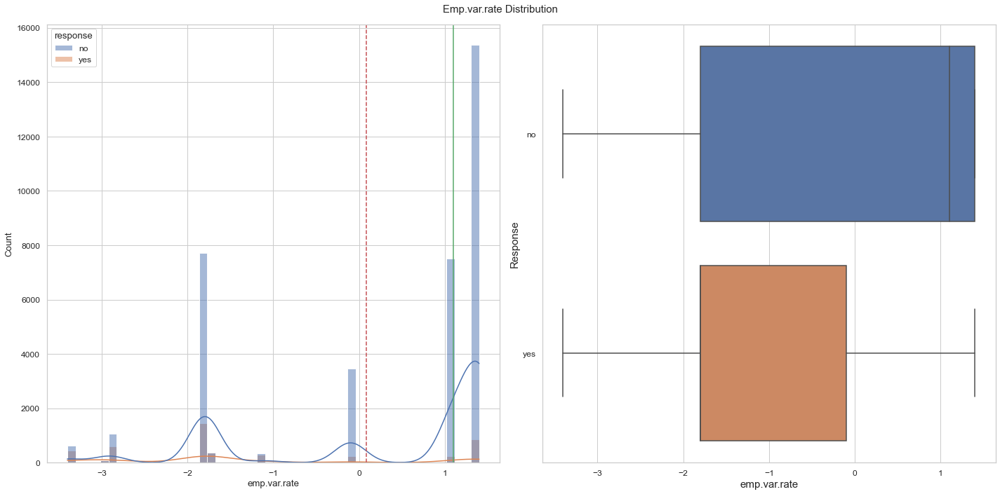

The emp.var.rate description for for both respnse classes =
          emp.var.rate                                             
                count      mean       std  min  25%  50%  75%  max
response                                                          
no            36537.0  0.248885  1.482873 -3.4 -1.8  1.1  1.4  1.4
yes            4639.0 -1.233089  1.623616 -3.4 -1.8 -1.8 -0.1  1.4


In [98]:
distribution_plot('emp.var.rate')

In [210]:
success_rate = pd.crosstab(bank_data['response'], bank_data['emp.var.rate'], margins=True).T
success_rate['success_rate %'] = success_rate['yes'] / success_rate['All'] * 100
success_rate.T.round()

emp.var.rate,-3.4,-3.0,-2.9,-1.8,-1.7,-1.1,-0.2,-0.1,1.1,1.4,All
response,,,,,,,,,,,
no,616.0,84.0,1069.0,7721.0,370.0,334.0,9.0,3450.0,7522.0,15362.0,36537.0
yes,454.0,88.0,593.0,1461.0,403.0,301.0,1.0,232.0,240.0,866.0,4639.0
All,1070.0,172.0,1662.0,9182.0,773.0,635.0,10.0,3682.0,7762.0,16228.0,41176.0
success_rate %,42.0,51.0,36.0,16.0,52.0,47.0,10.0,6.0,3.0,5.0,11.0


In [213]:
s = bank_data.groupby([ 'emp.var.rate', 'month']).agg(num_calls=('emp.var.rate', 'count'))
s

num_calls
emp.var.rate month           
-3.4         nov          357
             oct          446
             sep          267
-3.0         dec          172
-2.9         aug          770
             jul          177
             jun          715
-1.8         apr         2631
             mar          546
             may         6005
-1.7         aug          233
             jul          311
             jun          229
-1.1         nov          128
             oct          204
             sep          303
-0.2         dec           10
-0.1         nov         3615
             oct           67
 1.1         may         7762
 1.4         aug         5173
             jul         6681
             jun         4374

In [214]:
bank_data.groupby(['emp.var.rate']).agg(num_calls=('emp.var.rate', 'count')).sort_values('num_calls', ascending=False).T

emp.var.rate,1.4,-1.8,1.1,-0.1,-2.9,-3.4,-1.7,-1.1,-3.0,-0.2
num_calls,16228,9182,7762,3682,1662,1070,773,635,172,10


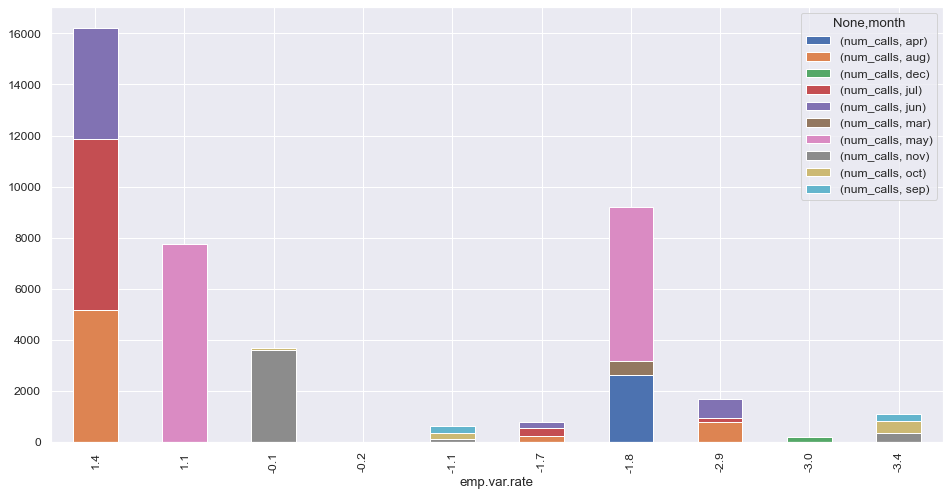

In [215]:
s.unstack().sort_index(ascending=False).plot(kind='bar', stacked=True, figsize=(16, 8))
plt.show()

* **Insights**
- 10 distinct rates were reported during the campaign. It seems like most of the campaign time happened when the employment variation rate is negative; in 4 months out of 10, this rate was positive.
- From the graph, the campaign calls focused more on the time with a positive rate. However, a higher subscription rate per call was reported when the employment variation rate -1.7 = 52% and -3.0 = 51%. Only 5% of the called customers subscribed when emp.var.rate = 1.4 and 3% when it was (1.1).
- The higher rate did not lead to more subscriptions.


### The **cons.price.idx** Feature

 The cons.price.idx feature is consumer price index — monthly indicator (numeric)

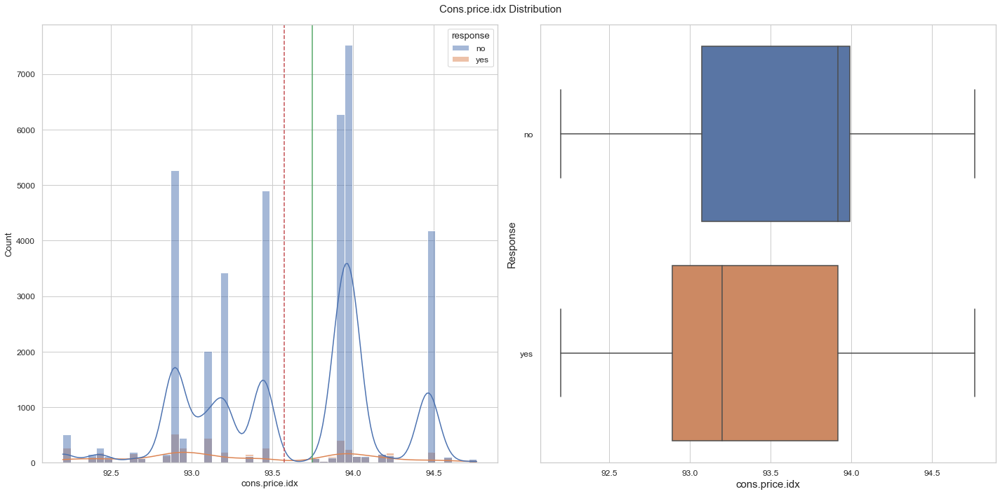

The cons.price.idx description for for both respnse classes =
          cons.price.idx                                                       \
                  count       mean       std     min     25%     50%     75%   
response                                                                       
no              36537.0  93.603798  0.559006  92.201  93.075  93.918  93.994   
yes              4639.0  93.354577  0.676592  92.201  92.893  93.200  93.918   

                  
             max  
response          
no        94.767  
yes       94.767  


In [109]:
distribution_plot('cons.price.idx')

In [104]:
bank_data.groupby('response')[['cons.price.idx']].median().rename(columns={'cons.price.idx': 'median for cons.price.idx'})

,median for cons.price.idx
response,
no,93.918
yes,93.200


In [107]:
bank_data.groupby('response')['cons.price.idx'].value_counts().unstack()

cons.price.idx,92.201,92.379,92.431,92.469,92.649,92.713,92.756,92.843,92.893,92.963,...,93.876,93.918,93.994,94.027,94.055,94.199,94.215,94.465,94.601,94.767
response,,,,,,,,,,,,,,,,,,,,,
no,506,161,266,112,189,84,9,156,5269,451,...,90,6274,7522,113,122,153,135,4186,111,70
yes,264,106,180,65,168,88,1,126,524,264,...,122,407,240,120,107,150,176,188,93,58


* **Insights**
- There is an overlap of the two response classes across most values of cons.price.idx  

### The **cons.conf.idx** Feature

 The cons.conf.idx feature is the consumer confidence index — monthly indicator (numeric)

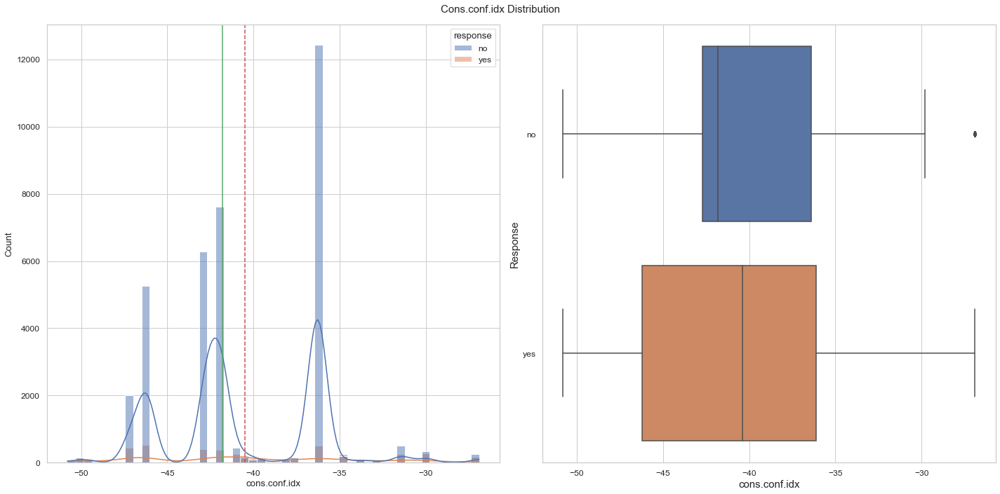

The cons.conf.idx description for for both respnse classes =
          cons.conf.idx                                                   
                 count       mean       std   min   25%   50%   75%   max
response                                                                 
no             36537.0 -40.593232  4.390759 -50.8 -42.7 -41.8 -36.4 -26.9
yes             4639.0 -39.791119  6.139657 -50.8 -46.2 -40.4 -36.1 -26.9


In [112]:
distribution_plot('cons.conf.idx')

In [115]:
bank_data.groupby('response')[['cons.conf.idx']].median().rename(columns={'cons.conf.idx': 'median for cons.conf.idx'})

,median for cons.conf.idx
response,
no,-41.8
yes,-40.4


In [116]:
bank_data.groupby('response')['cons.conf.idx'].value_counts().unstack()

cons.conf.idx,-50.8,-50.0,-49.5,-47.1,-46.2,-45.9,-42.7,-42.0,-41.8,-40.8,...,-36.4,-36.1,-34.8,-34.6,-33.6,-33.0,-31.4,-30.1,-29.8,-26.9
response,,,,,,,,,,,,,,,,,,,,,
no,70,156,111,2015,5269,9,6274,3425,4186,451,...,7522,4902,114,77,112,84,506,189,161,266
yes,58,126,93,442,524,1,407,190,188,264,...,240,271,150,97,65,88,264,168,106,180


* **Insights**
- There is an overlap of the two response classes. Most of the none subscribers are located when the cons.conf.idx higher in this data set.

### The **euribor3m** Feature

euribor 3 month rate — daily indicator (numeric)

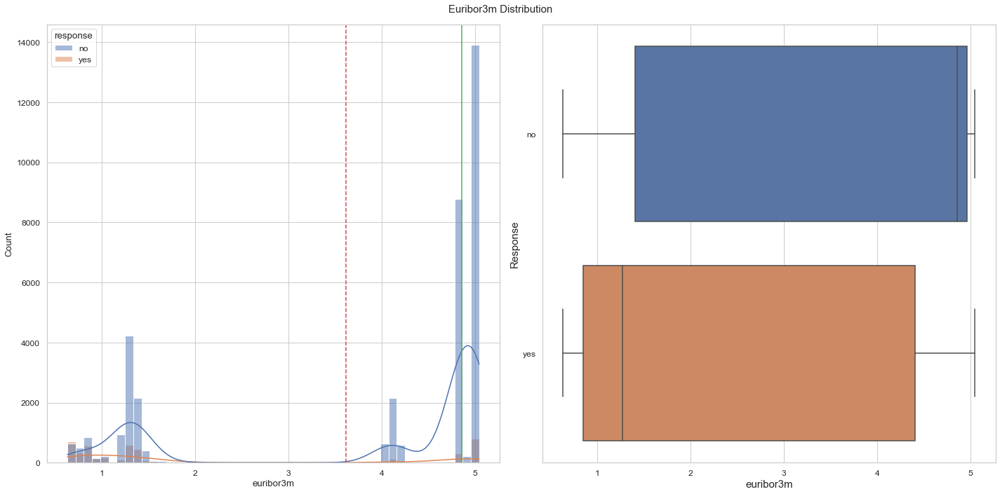

The euribor3m description for for both respnse classes =
          euribor3m                                                       
             count      mean       std    min    25%    50%    75%    max
response                                                                 
no         36537.0  3.811482  1.638179  0.634  1.405  4.857  4.962  5.045
yes         4639.0  2.123362  1.742717  0.634  0.849  1.266  4.406  5.045


In [117]:
distribution_plot('euribor3m')

In [118]:
bank_data.groupby('response')[['euribor3m']].median().rename(columns={'euribor3m': 'median for euribor3m'})

,median for euribor3m
response,
no,4.857
yes,1.266


In [119]:
bank_data.groupby('response')['euribor3m'].value_counts().unstack()

euribor3m,0.634,0.635,0.636,0.637,0.638,0.639,0.640,0.642,0.643,0.644,...,4.962,4.963,4.964,4.965,4.966,4.967,4.968,4.970,5.000,5.045
response,,,,,,,,,,,,,,,,,,,,,
no,2.0,21.0,11.0,1.0,2.0,5.0,5.0,18.0,12.0,14.0,...,2467.0,2361.0,1120.0,1006.0,572.0,610.0,934.0,168.0,4.0,4.0
yes,6.0,22.0,3.0,5.0,5.0,11.0,5.0,17.0,11.0,24.0,...,144.0,126.0,55.0,64.0,48.0,33.0,57.0,4.0,3.0,5.0


* **Insights**
- There is an overlap of the two response classes.

### The **nr.employed** Feature

nr.employed: number of employees — quarterly indicator (numeric)

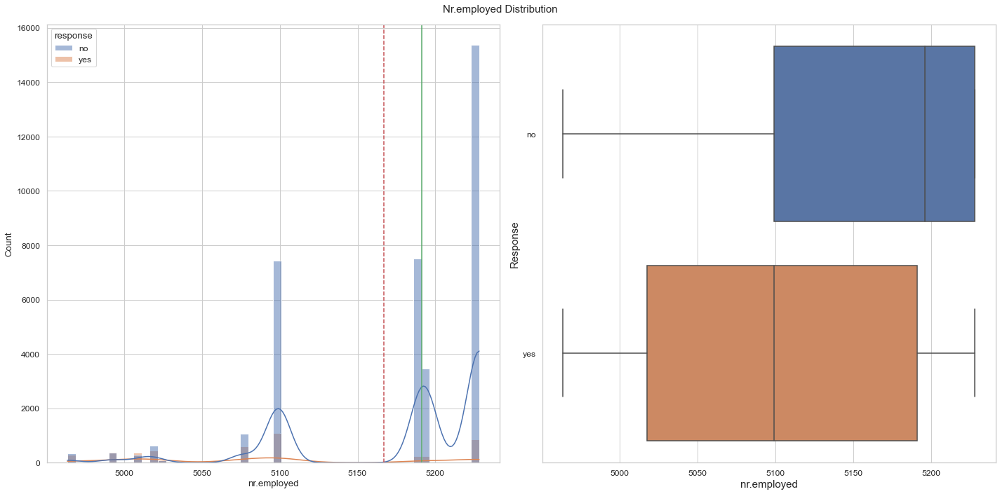

The nr.employed description for for both respnse classes =
          nr.employed                                                          \
               count         mean        std     min     25%     50%     75%   
response                                                                       
no           36537.0  5176.165690  64.570288  4963.6  5099.1  5195.8  5228.1   
yes           4639.0  5095.120069  87.581640  4963.6  5017.5  5099.1  5191.0   

                  
             max  
response          
no        5228.1  
yes       5228.1  


In [120]:
distribution_plot('nr.employed')

In [122]:
bank_data.groupby('response')[['nr.employed']].median().rename(columns={'nr.employed': 'median for nr.employed'})

,median for nr.employed
response,
no,5195.8
yes,5099.1


In [123]:
bank_data.groupby('response')['nr.employed'].value_counts().unstack()

nr.employed,4963.6,4991.6,5008.7,5017.5,5023.5,5076.2,5099.1,5176.3,5191.0,5195.8,5228.1
response,,,,,,,,,,,
no,334,370,281,616,84,1069,7440,9,7522,3450,15362
yes,301,403,369,454,88,593,1092,1,240,232,866


* **Insights**
- There is an overlap of the two response classes. More subscribers when the nr.employed is less than 5100 and more than 5000.
- The correlation matrix of Pearson correlation below shows that all socio-economic features are correlated with each other except the cons.conf.idx.
- As we see from the correlation analysis below, when changing the target variable to numeric of (1 and 0 ), we found that none of the socio-economic features correlates with the response variable.

In [11]:
socio_subset = bank_data[['emp.var.rate', 'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed', 'response']]
socio_subset['response'] = socio_subset['response'].replace({'yes': 1, 'no': 0})

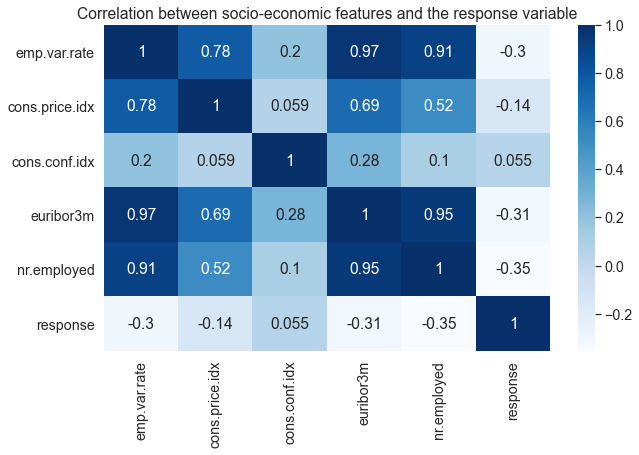

In [13]:
sns.set(font_scale=1.3)
fig, ax = plt.subplots(figsize=(10, 6))
ax = sns.heatmap(socio_subset.corr(), annot=True, ax=ax, cmap="Blues"); ax.set_title("Correlation between socio-economic features and the response variable");

## Correlation between all Numeric Features

We use here pearson (r): standard correlation coefficient to examine the linear relationship between the numerical variables. 

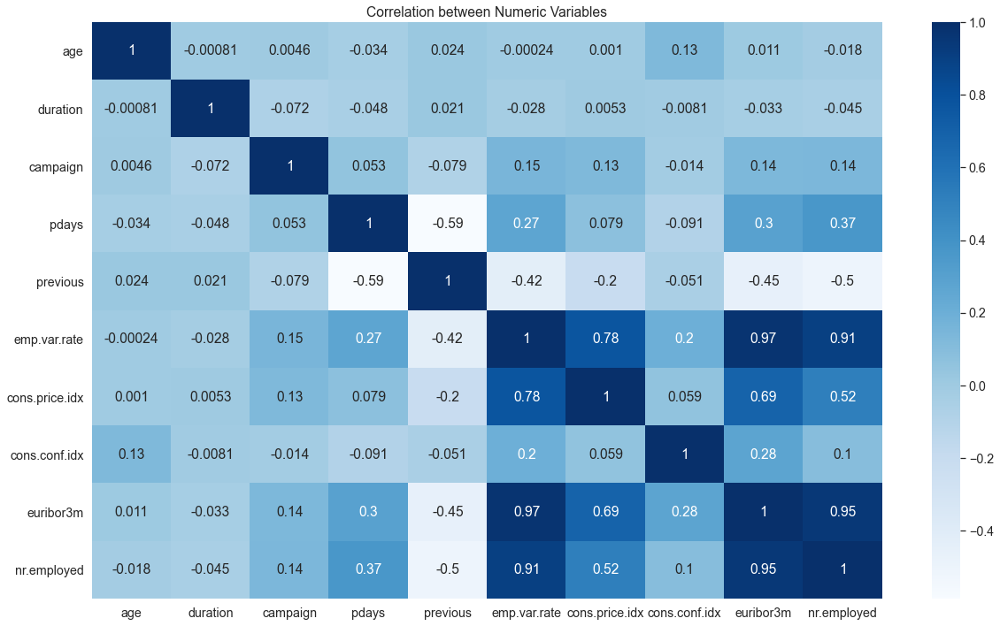

In [6]:
sns.set(font_scale=1.3)
fig, ax = plt.subplots(figsize=(20, 12))
ax = sns.heatmap(bank_data.corr(), annot=True, ax=ax, cmap="Blues"); ax.set_title("Correlation between Numeric Variables");

- **Insights**:\
 *Most of the social and economic context attributes are highly correlated.*
- euribor3m is highly correlated with emp.var.rate (r = 0.79), and with cons.price.idx (r = 0.69)
- emp.var.rate is highly correlated with euribor3m and with nr.employed (r = 0.91). Also, it has a strong relationship with cons.price.idx (r = 0.78)
- nr.employed is highly correlated with emp.var.rate (r = .91) and with euribor3m (r = 0.95). Also, it has relationship with cons.price,idx (r = 0.52)

# The Predictive Power Score (PPS)

- Another approach to finding the correlation through calculating the [Predictive Power Score (PPS)](https://github.com/8080labs/ppscore). Among the issues of the previous approaches is that Cramers V works with categorical data and Pearson correlation works with numeric data. Both approaches indicate symmetry of the relationship, which is not always the case. 
- **The [PPS](https://github.com/8080labs/ppscore) is an asymmetric, data-type-agnostic score that can detect linear or non-linear relationships between two columns. The score ranges from 0 (no predictive power) to 1 (perfect predictive power). It can be used as an alternative to the correlation (matrix).**
- The PPS approach is a way to find the correlation of the predictive power between the numerical and categorical variable which is not possible via Pearson Correlation.

In [124]:
# Import the package
import ppscore as pps

In [134]:
def heatmap(df):
    """This function generates the heatmap for the calculated predictive power score (PPS) matrix"""
    df = df[['x', 'y', 'ppscore']].pivot(columns='x', index='y', values='ppscore')
    fig, ax = plt.subplots(figsize=(20, 18))
    ax = sns.heatmap(df, vmin=0, vmax=1, cmap="Blues", linewidths=0.5, annot=True, annot_kws={"fontsize":13})
    ax.set_title("Predictive Power Score (PPS) matrix")
    ax.set_xlabel("feature")
    ax.set_ylabel("target")
    plt.show()
    

In [135]:
df = pps.matrix(bank_data)

In [136]:
df['ppscore'] = round(df['ppscore'], 2)

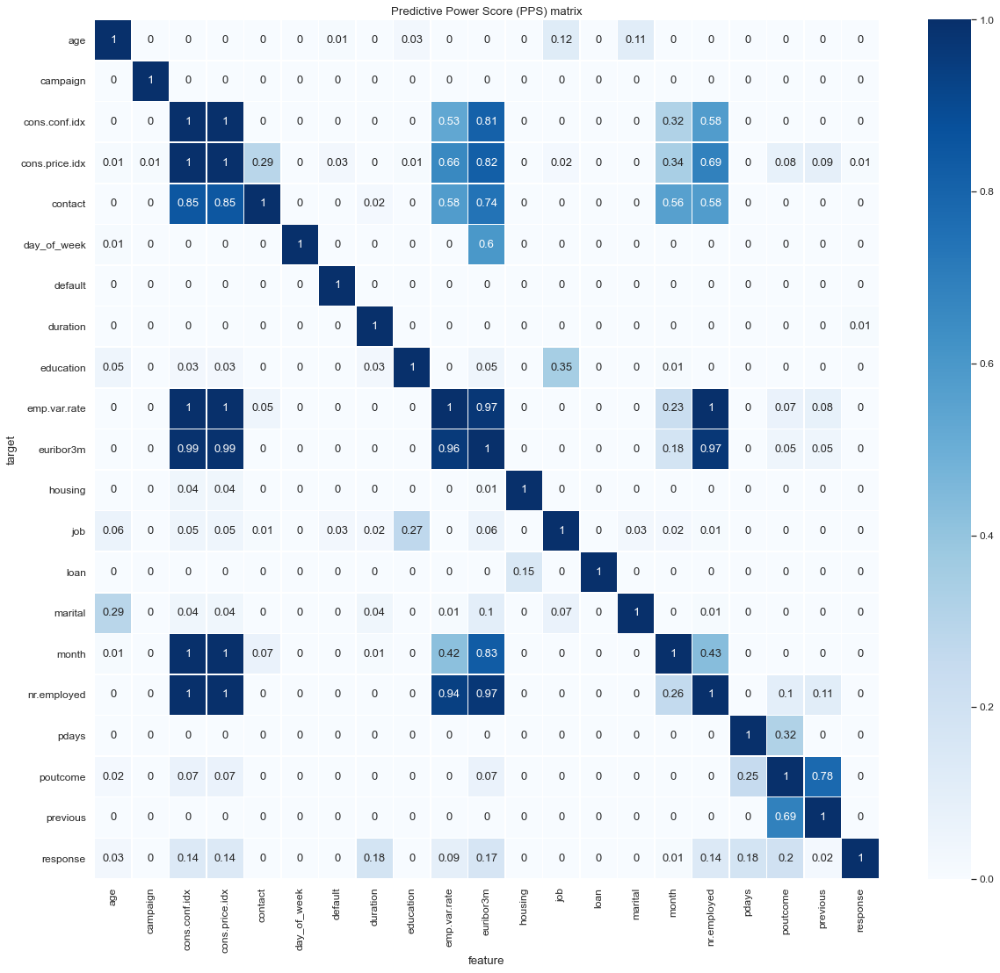

In [137]:
heatmap(df)

#### The predictive power with the target variable

In [193]:
pps = df[df['y']=='response'][['x', 'ppscore', 'y']].sort_values('ppscore', ascending=False, ignore_index=True).rename(columns={'x': 'Feature'})
pps.drop(0)

,Feature,ppscore,y
1,poutcome,0.20,response
2,pdays,0.18,response
3,duration,0.18,response
4,euribor3m,0.17,response
5,nr.employed,0.14,response
6,cons.conf.idx,0.14,response
7,cons.price.idx,0.14,response
8,emp.var.rate,0.09,response
9,age,0.03,response
10,previous,0.02,response


#### Comparison of the PPS and Cramer V

In [182]:
corr = pd.merge(phi, pps, how='outer').sort_values('ppscore', ascending=False, ignore_index=True).drop(0)
corr

,Feature,Cramers_V,ppscore,y
1,poutcome,0.320448,0.20,response
2,pdays,NaN,0.18,response
3,duration,NaN,0.18,response
4,euribor3m,NaN,0.17,response
5,cons.price.idx,NaN,0.14,response
6,cons.conf.idx,NaN,0.14,response
7,nr.employed,NaN,0.14,response
8,emp.var.rate,NaN,0.09,response
9,age,NaN,0.03,response
10,previous,NaN,0.02,response


- **Insights**:\
The output of PPS shows that there features have sort of predictive and ranked from the highest to the lowest as follows:
        - 'poutcome',
        -  'pdays',
        -  'duration',
        -  'euribor3m',
        - 'cons.price.idx',
        - 'cons.conf.idx',
        - 'nr.employed',
        - 'emp.var.rate',
        - 'age',
        - 'previous',
        - 'month'.
* PPS agrees with Cramers V that **poutcome** has the highest predictive power, $PPS = 0.2$ &  $\Phi = 0.32$.
* PPS revealed the predictive power (the correlation) between numeric and categorical variables, which cannot be found by any of the other methods.
* PPS confirmed the correlation between most of the social and economic context attributes ('euribor3m', 'cons.price.idx', 'cons.conf.idx', 'nr.employed'). Thus, it makes sense that they have similar PPS with the response variable around 14.

* However, none of the features by itself indicate a strong predictive power. We should point that None of these methods account for the interaction between the variables. The interaction can be verified by Modeling.
- The subscribers and none subscriber classes overlap across most of the variables. This is a challenging classification problem.


## A quick way to conduct Exploratory Data Analysis is through Pandas Profiling

In [9]:
#### Data profiling, generating html report.
profile_report = bank_data.profile_report(explorative=True, html={'style': {'full_width': True}})
profile_report